In [1]:
import sys
sys.path.insert(0, "../../")
from classes.calculators.lennardjones import LennardJones
from classes.atom_classes.atom_collection import Atom_Collection
from classes.atom_classes.atom import Atom
from classes.atom_classes.atom_collection_plotter import Atom_Collection_Plotter, Animator
from classes.optimizers.particle_swarm import Particle_swarm
import matplotlib.pyplot as plt
from matplotlib import animation
import numpy as np
plt.rc('animation', html='jshtml')

In [2]:
def random_inits(N, x_min=-4.0, x_max=4.0, y_min=-4.0, y_max=4.0):
    ns = np.random.rand(N,2)
    ns[:,0]*=(x_max-x_min)
    ns[:,0]+=x_min
    ns[:,1]*=(y_max-y_min)
    ns[:,1]+=y_min
    return ns

def create_atom_col(N_atoms, grid_size):
    atom_list = []
    init_pos = random_inits(N=N_atoms-1, x_min=grid_size[0], x_max=grid_size[1], y_min=grid_size[0], y_max=grid_size[1])
    init_pos_fixed = np.array([0.0,0.0])
    new_arr = np.insert(init_pos,0, init_pos_fixed).reshape(N_atoms, 2)
    for pos in new_arr:
        atom = Atom(pos)
        atom_list.append(atom)
    atom_col = Atom_Collection(atomlist=atom_list)
    atom_col.freeze_atoms(indices=[0])
    return atom_col

In [3]:
rattled_atoms = []
for i in range(200):
    rattled_col = create_atom_col(N_atoms=4, grid_size=[-4.0,4.0])
    rattled_col.calculator = LennardJones()
    rattled_atoms.append(rattled_col)

In [4]:
optimizer = Particle_swarm(rattled_atom_cols=rattled_atoms)
optimizer.run(N_max=5000, E_crit=-4000, track=True)
particles = optimizer.particles

In [5]:
class part_animator(Animator):
    def __init__(self, e_line, default_cols=..., markersize=50, scale_with_mass=False, alpha=1):
        super().__init__(default_cols, markersize, scale_with_mass, alpha)
        self.e_line = e_line

    def animate(self, i, atom_col, positions):
        atom_col.set_atom_positions(positions)
        plot_elems = self(atom_col)
        xs = np.linspace(0, i, i)
        #self.e_line.set_data(xs, pot_es[0:i])
        #print(plot_elems)
        return plot_elems["atoms"] #+ [self.e_line]

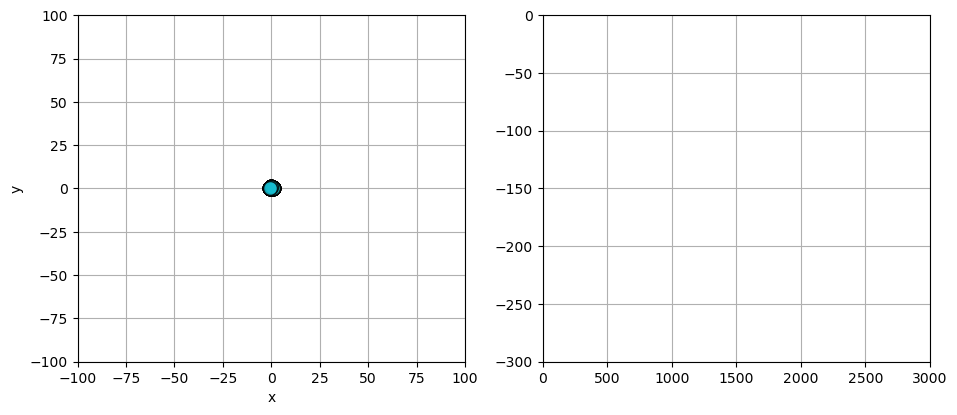

In [9]:
fig, axs = plt.subplots(1,2, figsize=(11,4.5))
axs[0].set_xlim([-100,100])
axs[0].set_ylim([-100,100])
axs[1].set_xlim([0,3000])
axs[1].set_ylim([-300, 00])
axs[0].set_xlabel("x")
axs[0].set_ylabel("y")

for ax in axs:
    ax.grid()

part_animators = []
atom_cols = []
for i, particle in enumerate(particles):
    atom_col = particle.logged_atom_cols[0]
    atom_col.reset_plot_axes()
    e_line = axs[1].plot([], [], c=f"C{i}")[0]
    p_anim = part_animator(e_line=e_line, default_cols=(f"C{i}", "blue"), markersize=10, alpha=0.8)
    part_animators.append(p_anim)
    atom_cols.append(atom_col)
    p_anim(atom_col=atom_col, ax=axs[0])


In [10]:
def update(i, particles, plot_cols, animators):
    tot_plot_elems = []
    for particle, animator, plot_col in zip(particles, animators, plot_cols):
        logged_col = particle.logged_atom_cols[i]
        plot_elems = animator.animate(i, plot_col, logged_col.positions)
        tot_plot_elems+=plot_elems
    return tot_plot_elems

In [11]:

anim = animation.FuncAnimation(fig,
                               update,
                               frames=np.arange(0, 5000, 10),
                               fargs=(particles, atom_cols, part_animators),
                               interval=75,
                               blit=True)
anim

In [125]:
np.random.rand(2,4)

array([[0.01698489, 0.81473387, 0.6535097 , 0.51057215],
       [0.70744504, 0.00669194, 0.66494445, 0.97934749]])